# T1 정글러 동선 파악 - 동선 지도 제작

커즈 : Cuzzzzzzz

엘림 : 엘 림, T1 Ellim

오너 : U face z, T1 Oner

In [2]:
import sys

sys.path.append('/Users/nia/Desktop/lol_data_analysis/my_packages')

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.image as img
import matplotlib.animation as ani

from matplotlib import rc
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pandas.io.json import json_normalize
from datetime import datetime

import myplot.colormap as mycmap

import warnings
warnings.filterwarnings(action='ignore')

In [3]:
## 한글 폰트
import matplotlib.font_manager as fm
import matplotlib as mpl

font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')

for font in font_list:
    if 'Nanum' in font:
        print(font)
        
print()
print(mpl.matplotlib_fname())

plt.rcParams["font.family"] = 'NanumGothic'

## 마이너스 부호
mpl.rcParams['axes.unicode_minus'] = False

/Library/Fonts/NanumSquareRegular.ttf
/System/Library/AssetsV2/com_apple_MobileAsset_Font6/ee9e9584cd1a5f676e03a9efcc80783bc7e12e2c.asset/AssetData/NanumGothic.ttc
/Library/Fonts/NanumSquareLight.ttf
/Library/Fonts/NanumBarunGothicUltraLight.ttf
/Library/Fonts/NanumSquareRoundB.ttf
/Library/Fonts/NanumSquareExtraBold.ttf
/Library/Fonts/NanumSquareBold.ttf
/System/Library/AssetsV2/com_apple_MobileAsset_Font6/3b0bb049516d6dd825e1cd8731587ca7415517ff.asset/AssetData/NanumScript.ttc
/Library/Fonts/NanumBarunpenRegular.ttf
/System/Library/AssetsV2/com_apple_MobileAsset_Font6/5c10807185ddbca859bc0b3ecefe55ebb1985aa9.asset/AssetData/NanumMyeongjo.ttc
/Library/Fonts/NanumMyeongjoBold.ttf
/Library/Fonts/NanumGothic.ttf
/Library/Fonts/NanumBarunpenBold.ttf
/Library/Fonts/NanumPen.ttf
/Library/Fonts/NanumSquareRoundR.ttf
/Library/Fonts/NanumBarunGothicBold.ttf
/Library/Fonts/NanumSquareRoundEB.ttf
/Library/Fonts/NanumMyeongjo.ttf
/Library/Fonts/NanumBarunGothicLight.ttf
/Library/Fonts/NanumGothic

In [4]:
def get_x_position(x):
    return x/15000*512

def get_y_position(y):
    return 512-((y/15000)*512)

## 정글러 리스트

In [6]:
Players = ['Cuzz', 'Ellim', 'Oner', 'Canyon', 'Malrang', 'Clid', 'Peanut', 'Croco', 'Dread']
# Players = ['Keria', 'BeryL', 'Life', 'Kellin', 'Effort', 'Lehends']

player_df = {}
player_timeline_df = {}

for player in Players:
    player_df[player] = pd.read_csv(f'./data/{player}.csv')
    player_timeline_df[player] = pd.read_csv(f'./data/{player}_timeline.csv')
    
    player_timeline_df[player]['gameId'] = player_timeline_df[player]['matchId'].apply(lambda x: int(str(x)[3:]) if 'KR' in str(x) else x)

## 챔피언 사용 빈도

In [7]:
#빈번하게 사용하는 챔프 모음

champs_freq_df = pd.DataFrame(index=Players)

for player in Players:
    for champ in player_df[player]['championName'].unique():
        
        count = player_df[player]['championName'].value_counts()[champ]
        if count >= 20:
            champs_freq_df.loc[player, champ] = count
            
champs_freq_df

,LeeSin,Nidalee,XinZhao,Diana,Rumble,Viego,Gragas,Karthus,Hecarim,Udyr,...,Gwen,Graves,Sett,Nocturne,Ekko,Sylas,Zac,Ryze,Gnar,Lillia
Cuzz,60.0,81.0,21.0,55.0,42.0,53.0,36.0,20.0,20.0,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Ellim,87.0,57.0,27.0,45.0,62.0,83.0,NaN,NaN,NaN,NaN,...,41.0,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Oner,193.0,88.0,39.0,71.0,57.0,79.0,NaN,NaN,23.0,NaN,...,NaN,44.0,38.0,35.0,25.0,NaN,NaN,NaN,NaN,NaN
Canyon,21.0,64.0,NaN,NaN,27.0,36.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,33.0,20.0,NaN,NaN,NaN
Malrang,42.0,NaN,22.0,23.0,44.0,48.0,40.0,NaN,NaN,NaN,...,NaN,25.0,NaN,NaN,NaN,NaN,NaN,21.0,NaN,NaN
Clid,55.0,NaN,22.0,51.0,NaN,39.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Peanut,40.0,21.0,NaN,54.0,31.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Croco,70.0,35.0,NaN,25.0,NaN,NaN,21.0,NaN,NaN,23.0,...,NaN,30.0,NaN,NaN,NaN,NaN,NaN,NaN,26.0,20.0
Dread,40.0,35.0,NaN,20.0,NaN,27.0,NaN,NaN,20.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.0


In [9]:
#시간대별 포지션 모음

X_position_array = {}
Y_position_array = {}

for player in Players:
    
    X_position_array[player] = {}
    Y_position_array[player] = {}
    
    champs = champs_freq_df.loc[player].dropna().index.to_list()

    for champ in champs:
        
        X_position_array[player][champ] = {}
        Y_position_array[player][champ] = {}

        for i, side in enumerate(['blue', 'red']):
        
            gameIds = player_df[player].loc[(player_df[player]['championName'] == champ) & (player_df[player]['teamId'] == (i+1)*100)]['gameId'].values
        
            x_array = np.zeros((10,len(gameIds)))
            y_array = np.zeros((10,len(gameIds)))

            for g, gameId in enumerate(gameIds):
                timeline_df = player_timeline_df[player].loc[player_timeline_df[player]['gameId'] == gameId][['position.x', 'position.y', 'timestamp']].reset_index(drop=True)[1:11]
                for i in range(10):
                    try:
                        x = get_x_position(timeline_df.loc[i+1,'position.x'])
                        y = get_y_position(timeline_df.loc[i+1,'position.y'])

                        x_array[i][g] = x
                        y_array[i][g] = y

                    except Exception as e:
                        pass

            X_position_array[player][champ][side] = x_array
            Y_position_array[player][champ][side] = y_array

=========== LeeSin ===========
9
========== Nidalee ===========
7
========== XinZhao ===========
5
=========== Diana ============
8
=========== Rumble ===========
6
=========== Viego ============
7
=========== Gragas ===========
3
========== Hecarim ===========
3
========== Kindred ===========
4
=========== Graves ===========
4


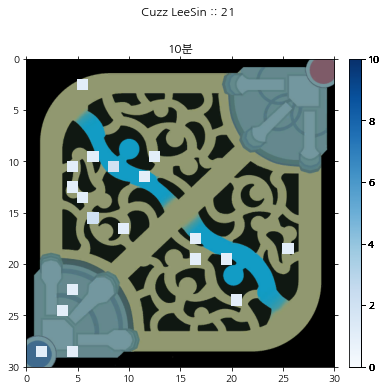

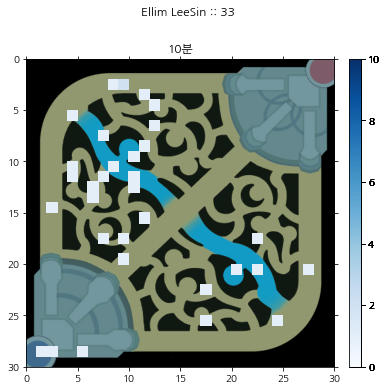

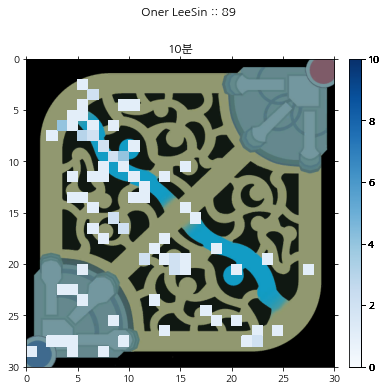

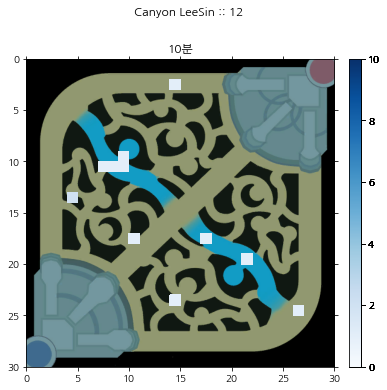

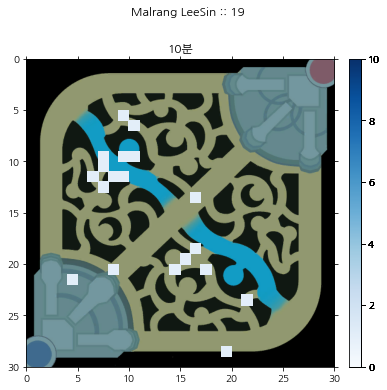

...

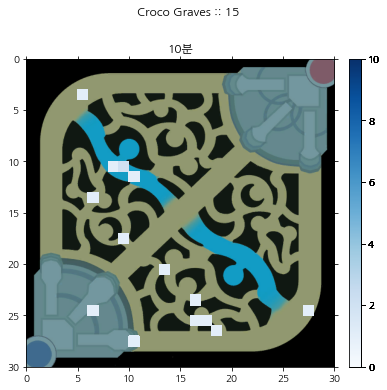

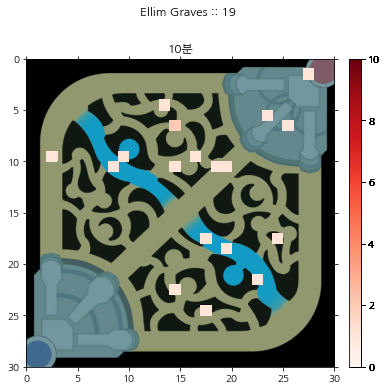

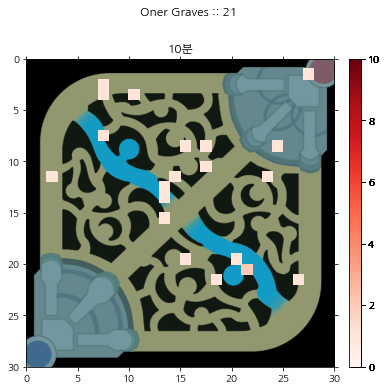

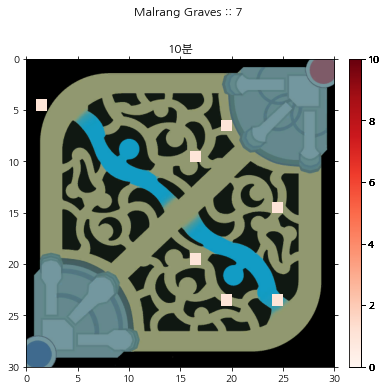

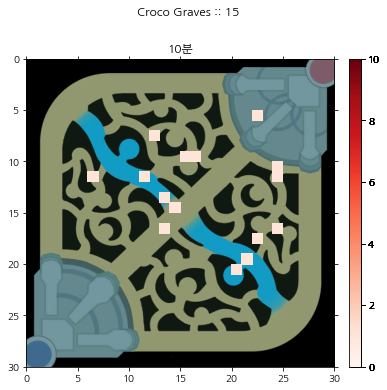

In [12]:
#시간대별 위치 애니메이션

rift_map = img.imread('../img/map/map11.png')
        
def init():
    im = ax.imshow(rift_map, origin='upper', extent=[0,30,30,0])
    return im

def animate(i, side):
    global x_array, y_array

    ax.clear()
    ax.imshow(rift_map, origin='upper', extent=[0,30,30,0])
    ax.set(title=f'{i+1}분')

    x = x_array[i]
    y = y_array[i]
    
    heatmap, _, _ = np.histogram2d(x, y, bins=30, range=[[0,512],[0,512]])
    heatmap[heatmap==0] = np.nan
    
    if side == 'blue':
        cmap = 'Blues'
    else:
        cmap = 'Reds'
        
    im = ax.pcolor(heatmap.T, cmap=cmap, vmin=0, vmax=10)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='4%', pad=0.2)

    fig.colorbar(im, cax=cax)
    return im

for champ in champs_freq_df.columns:
    
    junglers = champs_freq_df[[champ]].dropna().index.to_list()
    jungler_num = len(junglers)
    
    if jungler_num <3: continue
    
    s_champ = ' '+champ+' '
    print(f'{s_champ:=^30}')
    print(jungler_num)
    
    for side in ['blue', 'red']:
        for jungler in junglers:

            x_array = X_position_array[jungler][champ][side]
            y_array = Y_position_array[jungler][champ][side]


            fig, ax = plt.subplots(figsize=(6,6))
            fig.suptitle(f'{jungler} {champ} :: {x_array.shape[1]}')


            anim = ani.FuncAnimation(fig, animate, fargs=(side,), init_func=init, frames=10, interval=500, repeat=True)
            anim.save(f'result/{champ}_{side}_{jungler}.mp4', fps=1)
# rc('animation',html='html5')
# anim